<a href="https://colab.research.google.com/github/entc-17-fyp-20/CM_Clustering_Method/blob/main/Radar_plots_classification.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# importing libraries
import os
import zipfile
import glob
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.cm as cm
import keras
import cv2
%matplotlib inline
#import K-Means
from sklearn.cluster import KMeans
# important metrics
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
path = "/content/drive/MyDrive/Colab Notebooks/CNN/Radar plots (1)/T09/"

In [ ]:
from tensorflow.keras.applications.inception_v3 import InceptionV3
from tensorflow.keras.applications.inception_v3 import preprocess_input
from tensorflow.keras.preprocessing import image
from tensorflow.keras.preprocessing.image import img_to_array
from sklearn.cluster import KMeans
import pandas as pd
import numpy as np
from tqdm import tqdm
import os
import shutil

In [ ]:
# multivariate data preparation
from numpy import array
from numpy import hstack
import pandas as pd
import numpy as np

from keras.models import Sequential
from keras.layers import Dense
from keras.layers import Flatten
from keras.layers.convolutional import Conv1D
from keras.layers.convolutional import MaxPooling1D

import tensorflow as tf

from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.layers.experimental import preprocessing

import plotly.express as px
import plotly.graph_objects as go


In [ ]:
df = pd.read_csv('/content/drive/MyDrive/Merged/T22.csv')
df['Date_Time'] = pd.to_datetime(df['Date_Time'], format="%Y-%m-%d %H:%M:%S")
df = df.set_index(df['Date_Time'])

In [ ]:
df1 = df[:'2017-03-19 05:10:00']
df2 = df['2017-04-13 16:10:00':"2017-05-31 00:00:00"]
df3 = df["2017-06-01 00:00:00":"2017-07-17 02:50:00"]
df4 = df['2017-07-21 08:10:00':'2017-08-14 05:20:00']
df5 = df['2018-01-15 12:00:00':"2018-02-10 23:50:00"]
df6 = df['2018-02-13 00:00:00':'2018-04-21 06:40:00']
df7 = df['2018-05-01 10:10:00':"2018-05-31 00:00:00"]
df8 = df['2018-06-01 00:00:00':'2018-08-14 06:50:00']
df9 = df['2018-08-21 07:00:00':]

In [ ]:
df = df['2018-05-08 08:40:00':'2018-05-18 19:50:00']


In [ ]:
cols = df.columns.tolist()
cols

['Date_Time',
 'Ambient_Temperature',
 'Gear_Bearing_Temperature',
 'Gear_Oil_Tempeature',
 'Generator_Bearing_Tempeature',
 'Generator_RPM',
 'Possible_Active_Power',
 'Active_Power',
 'Reactive_Power',
 'Voltage1',
 'Voltage2',
 'Voltage3',
 'Hydrulic_Oil_Pressure',
 'Hydrulic_Oil_Temperature',
 'Wind_Speed']

In [ ]:
#df = df9
cols = df.columns.tolist()
cols=cols[1:6]+[cols[-1]]+[cols[7]];
df=df[cols];
df

,Ambient_Temperature,Gear_Bearing_Temperature,Gear_Oil_Tempeature,Generator_Bearing_Tempeature,Generator_RPM,Wind_Speed,Active_Power
Date_Time,,,,,,,
2018-05-08 08:40:00,16,44,48,41,24.8,2.3,-8.6
2018-05-08 08:50:00,14,43,48,39,174.8,3.7,-12.0
2018-05-08 09:00:00,13,44,48,38,722.5,3.3,48.3
2018-05-08 09:10:00,14,46,48,36,803.1,4.1,85.1
2018-05-08 09:20:00,14,46,48,35,810.5,4.5,105.3
...,...,...,...,...,...,...,...
2018-05-18 19:10:00,17,40,40,36,182.4,3.1,-8.6
2018-05-18 19:20:00,17,42,41,35,739.5,2.7,65.7
2018-05-18 19:30:00,17,45,42,35,846.5,2.8,120.8


In [ ]:
import pandas as pd
from sklearn import preprocessing

x = df.values #returns a numpy array
min_max_scaler = preprocessing.MinMaxScaler()
x_scaled = min_max_scaler.fit_transform(x)
df_s = pd.DataFrame(x_scaled)

# Radar charts generation

Streaming output truncated to the last 5000 lines.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control thi

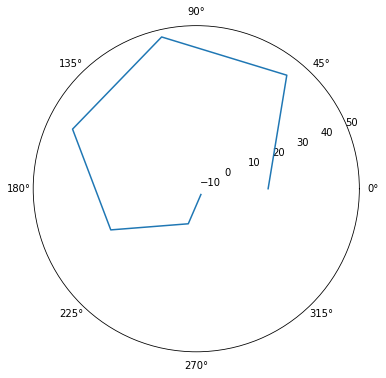

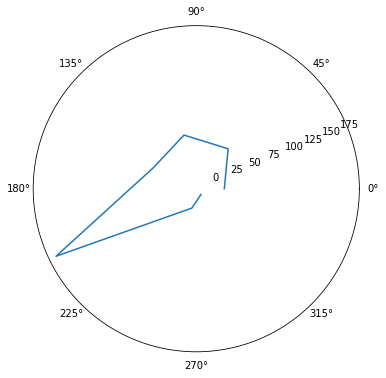

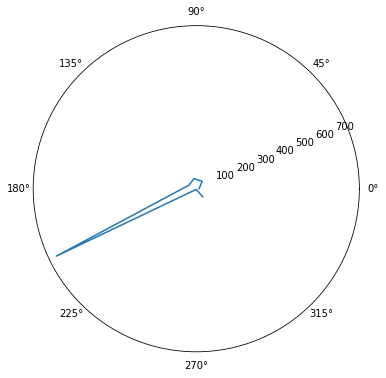

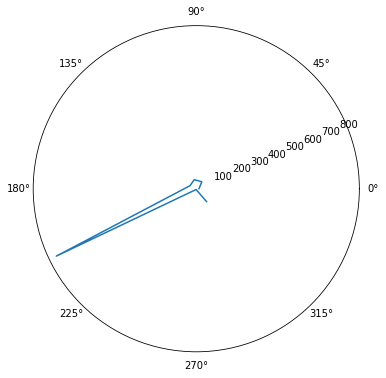

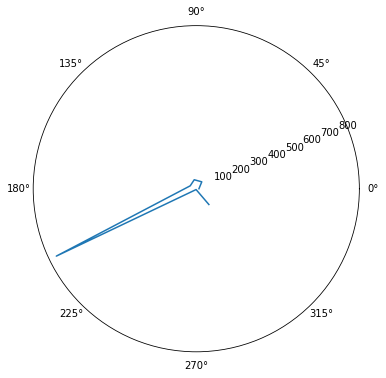

...

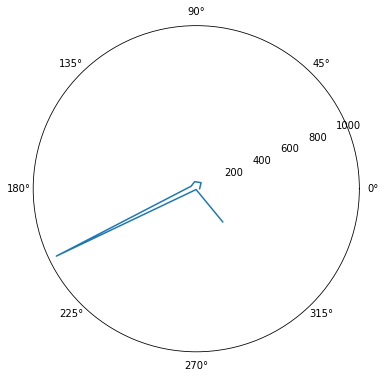

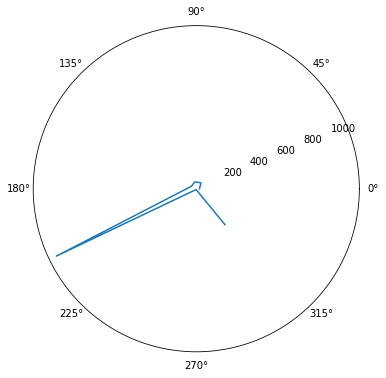

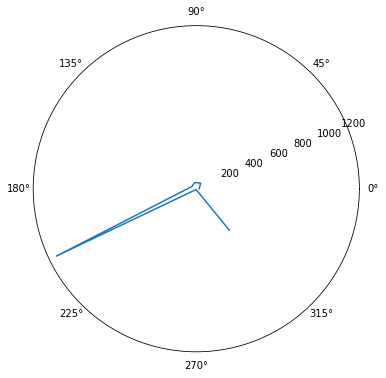

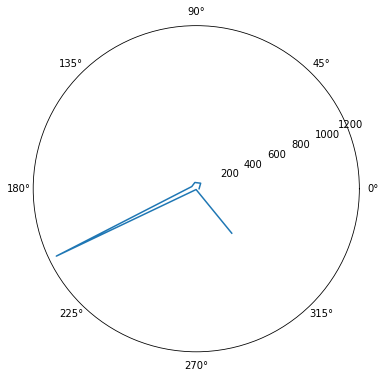

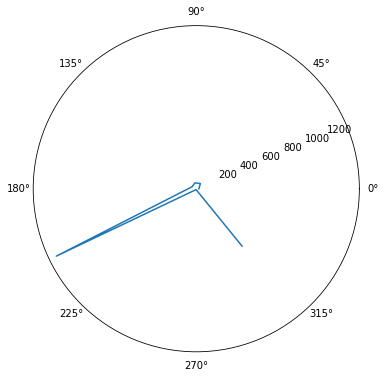

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

dfn=np.array(df);
angles=np.linspace(0,2*np.pi,7, endpoint=False)

for i in range(0,len(dfn)):
    fig=plt.figure(figsize=(6,6))
    ax=fig.add_subplot(polar=True)
    ax.plot(angles,dfn[i])
    ax.grid(False)
    fig.savefig('/content/drive/MyDrive/Colab Notebooks/CNN/Radar plots (1)/T22_norm/' + str(df.index[i])+'.png')

# Feature Extraction

In [ ]:
def image_feature(direc):
    model = InceptionV3(weights='imagenet', include_top=False)
    features = [];
    img_name = [];
    for i in tqdm(direc):
        fname=path+i
        img=image.load_img(fname,target_size=(200,200))
        x = img_to_array(img)
        x=np.expand_dims(x,axis=0)
        x=preprocess_input(x)
        feat=model.predict(x)
        feat=feat.flatten()
        features.append(feat)
        img_name.append(i)
    return features,img_name

# Kmeans Clustering

In [ ]:
path = "/content/drive/MyDrive/Colab Notebooks/CNN/Radar plots (1)/Untitled folder/"

img_path=os.listdir(path)
img_features,img_name=image_feature(img_path)

k = 3
clusters = KMeans(k, random_state = 40)
clusters.fit(img_features)

image_cluster = pd.DataFrame(img_name,columns=['image'])
image_cluster["clusterid"] = clusters.labels_
image_cluster 

87924736/87910968 [==============================] - 1s 0us/step


100%|██████████| 1364/1364 [11:55<00:00,  1.91it/s]


,image,clusterid
0,2017-01-03 21:20:00.png,1
1,2017-01-03 21:30:00.png,1
2,2017-01-03 21:40:00.png,1
3,2017-01-03 21:50:00.png,1
4,2017-01-03 22:00:00.png,1
...,...,...
1359,2017-01-03 20:30:00.png,1
1360,2017-01-03 20:40:00.png,1
1361,2017-01-03 20:50:00.png,1
1362,2017-01-03 21:00:00.png,1


In [ ]:
print(image_cluster.to_string())

                        image  clusterid
0     2017-01-03 21:20:00.png          1
1     2017-01-03 21:30:00.png          1
2     2017-01-03 21:40:00.png          1
3     2017-01-03 21:50:00.png          1
4     2017-01-03 22:00:00.png          1
5     2017-01-03 22:10:00.png          1
6     2017-01-03 22:20:00.png          1
7     2017-01-03 22:30:00.png          1
8     2017-01-03 22:40:00.png          1
9     2017-01-03 22:50:00.png          1
10    2017-01-03 23:00:00.png          1
11    2017-01-03 23:10:00.png          1
12    2017-01-03 23:20:00.png          1
13    2017-01-03 23:30:00.png          1
14    2017-01-03 23:40:00.png          1
15    2017-01-03 23:50:00.png          1
16    2017-01-04 00:00:00.png          1
17    2017-01-04 00:10:00.png          1
18    2017-01-04 00:20:00.png          1
19    2017-01-04 00:30:00.png          1
20    2017-01-04 00:40:00.png          1
21    2017-01-04 00:50:00.png          1
22    2017-01-04 01:00:00.png          1
23    2017-01-04

In [ ]:
fig = px.line(image_cluster, y='clusterid') 
fig.show()

In [ ]:
data = []
for i in range(0,len(image_cluster)):
  if(image_cluster.iloc[i][1]==2):
    data.append(1)
  else:
    data.append(0)

In [ ]:
data = pd.DataFrame(data,columns=['f'])

In [ ]:
fig = px.line(data, y='f') 
fig.show()

In [ ]:
data_windowed=[]
for i in range(0,len(data)-5):
  if(data[i:i+30].sum()[0]==30):
    data_windowed.append(1)
  else:
    data_windowed.append(0)
 
data_windowed= pd.DataFrame(data_windowed,columns=['f'])
fig = px.line(data_windowed, y='f') 
fig.show()

# Predictions

## Radar plot generation and saving

In [ ]:
df = pd.read_csv('/content/drive/MyDrive/Merged/T01.csv')
df['Date_Time'] = pd.to_datetime(df['Date_Time'], format="%Y-%m-%d %H:%M:%S")
df = df.set_index(df['Date_Time'])

df = df['2018-06-05 08:40:00':'2018-07-14 19:50:00']
cols = df.columns.tolist()
cols=cols[1:6]+[cols[-1]]+[cols[7]];
df=df[cols];
df.head()

,Ambient_Temperature,Gear_Bearing_Temperature,Gear_Oil_Tempeature,Generator_Bearing_Tempeature,Generator_RPM,Wind_Speed,Active_Power
Date_Time,,,,,,,
2018-06-05 08:40:00,13,52,49,43,1075.9,5.9,413.4
2018-06-05 08:50:00,13,51,49,43,981.1,6.1,307.8
2018-06-05 09:00:00,13,50,48,42,905.8,5.4,227.8
2018-06-05 09:10:00,13,48,48,41,819.1,5.0,100.5
2018-06-05 09:20:00,14,47,47,40,832.1,4.2,127.4


In [ ]:
dfn=np.array(df);
angles=np.linspace(0,2*np.pi,7, endpoint=False)

for i in range(0,len(dfn)):
    fig=plt.figure(figsize=(6,6))
    ax=fig.add_subplot(polar=True)
    ax.plot(angles,dfn[i])
    ax.grid(False)
    fig.savefig('/content/drive/MyDrive/Colab Notebooks/CNN/Radar plots (1)/predict/' + str(df.index[i])+'.png')



Streaming output truncated to the last 5000 lines.
More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:5: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:5: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.7/

## Predictions

## T09 Fault

In [ ]:
path = "/content/drive/MyDrive/Colab Notebooks/CNN/Radar plots (1)/T09/"

img_path=os.listdir(path)
img_features,img_name=image_feature(img_path)

fig = px.line(pd.DataFrame(clusters.predict(img_features),columns=['f']), y='f') 
fig.show()

100%|██████████| 356/356 [03:07<00:00,  1.90it/s]


In [ ]:
image_cluster=pd.DataFrame(clusters.predict(img_features))

In [ ]:
data = []
for i in range(0,len(image_cluster)):
  if(image_cluster[0][i]==2):
    data.append(1)
  else:
    data.append(0)

data = pd.DataFrame(data,columns=['f'])

In [ ]:
fig = px.line(data, y='f') 
fig.show()

In [ ]:
data_windowed=[]
for i in range(0,len(data)-5):
  if(data[i:i+20].sum()[0]==20):
    data_windowed.append(1)
  else:
    data_windowed.append(0)
 
data_windowed= pd.DataFrame(data_windowed,columns=['f'])

In [ ]:
fig = px.line(data_windowed, y='f') 
fig.show()

# T22 fault 

In [ ]:
path = "/content/drive/MyDrive/Colab Notebooks/CNN/Radar plots (1)/T22/"

img_path=os.listdir(path)
img_features,img_name=image_feature(img_path)

fig = px.line(pd.DataFrame(clusters.predict(img_features),columns=['f']), y='f') 
fig.show()


100%|██████████| 1500/1500 [02:53<00:00,  8.66it/s]


In [ ]:
image_cluster=pd.DataFrame(clusters.predict(img_features))

data = []
for i in range(0,len(image_cluster)):
  if(image_cluster[0][i]==2):
    data.append(1)
  else:
    data.append(0)

data = pd.DataFrame(data,columns=['f'])

data_windowed=[]
for i in range(0,len(data)-5):
  if(data[i:i+20].sum()[0]==20):
    data_windowed.append(1)
  else:
    data_windowed.append(0)
 
data_windowed= pd.DataFrame(data_windowed,columns=['f'])

fig = px.line(data_windowed, y='f') 
fig.show()


## T09 Normal

In [ ]:
path = "/content/drive/MyDrive/Colab Notebooks/CNN/Radar plots (1)/T22_norm/"

img_path=os.listdir(path)
img_features,img_name=image_feature(img_path)

fig = px.line(pd.DataFrame(clusters.predict(img_features),columns=['f']), y='f') 
fig.show()


100%|██████████| 1430/1430 [02:46<00:00,  8.58it/s]


In [ ]:
image_cluster=pd.DataFrame(clusters.predict(img_features))

data = []
for i in range(0,len(image_cluster)):
  if(image_cluster[0][i]==2):
    data.append(1)
  else:
    data.append(0)

data = pd.DataFrame(data,columns=['f'])

data_windowed=[]
for i in range(0,len(data)-5):
  if(data[i:i+20].sum()[0]==20):
    data_windowed.append(1)
  else:
    data_windowed.append(0)
 
data_windowed= pd.DataFrame(data_windowed,columns=['f'])

fig = px.line(data_windowed, y='f') 
fig.show()